In [ ]:
!pip install ucimlrepo
!pip install libsvm-official

Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 64.9783%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 76.1216%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 77.1346%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy = 65.123%
Cross Validation Accuracy

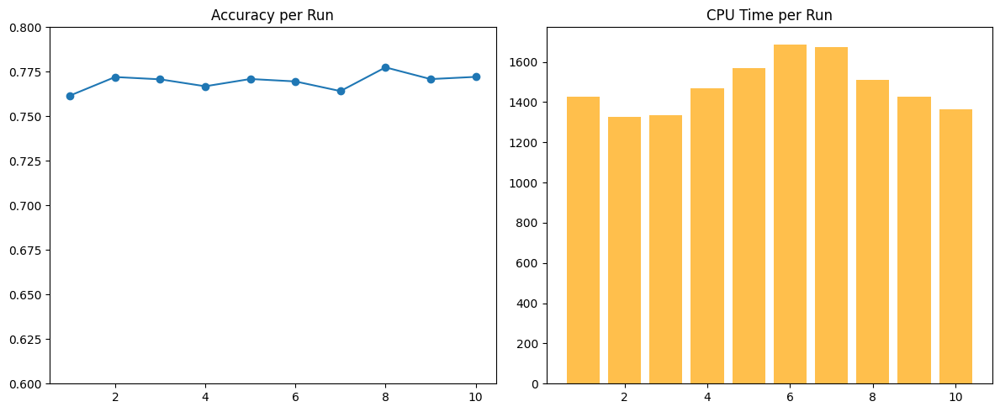

In [ ]:
import numpy as np
import time
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import roc_auc_score, confusion_matrix
from libsvm.svmutil import svm_problem, svm_parameter, svm_train, svm_predict
from ucimlrepo import fetch_ucirepo

np.random.seed(42)

class FOASVM:
    def __init__(self, population_size=8, max_iterations=250, ax=20, bx=10, ay=20, by=10): 
        self.population_size = population_size
        self.max_iterations = max_iterations
        self.ax, self.bx = ax, bx
        self.ay, self.by = ay, by

    def initialize_population(self):
        self.X_axis = np.random.uniform(-1, 1, 2)
        self.Y_axis = np.random.uniform(-1, 1, 2)

    def smell_concentration(self, C, gamma, X, y):
        prob = svm_problem(y.tolist(), X.tolist())
        param = svm_parameter(f'-s 0 -t 2 -c {C} -g {gamma} -v 5 -q')  
        score = svm_train(prob, param)
        return score / 100

    def search(self, X, y):
        best_score = -np.inf
        best_C = best_gamma = 0
        for _ in range(self.max_iterations):
            X_pos = self.X_axis + self.ax * np.random.rand(self.population_size, 2) - self.bx
            Y_pos = self.Y_axis + self.ay * np.random.rand(self.population_size, 2) - self.by
            D = np.sqrt(X_pos**2 + Y_pos**2)
            D = np.where(D == 0, 1e-10, D)
            S = 1 / D

            for i in range(self.population_size):
                log_C = S[i, 0] * 20.0 - 5.0
                log_gamma = S[i, 1] * 16.0 - 15.0
                log_C_clipped = np.clip(log_C, -5.0, 15.0)
                log_gamma_clipped = np.clip(log_gamma, -15.0, 1.0)
                C = 2.0 ** log_C_clipped
                gamma = 2.0 ** log_gamma_clipped

                score = self.smell_concentration(C, gamma, X, y)
                if score > best_score:
                    best_score = score
                   
                    best_C, best_gamma = C, gamma
                    self.X_axis, self.Y_axis = X_pos[i], Y_pos[i]
        return best_C, best_gamma, best_score

    def fit(self, X, y):
        # Handle missing values
        df = pd.DataFrame(X)
        df.fillna(df.mean(), inplace=True)
        X = df.values

        all_acc, all_auc, all_sens, all_spec = [], [], [], []
        run_times = []

        for run in range(10):  
            outer_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42 + run)
            run_acc, run_auc, run_sens, run_spec = [], [], [], []
            fold_times = []

            for train_idx, test_idx in outer_cv.split(X, y):
                start = time.time()
                X_train, X_test = X[train_idx], X[test_idx]
                y_train, y_test = y[train_idx], y[test_idx]

                # Scaling per fold
                scaler = MinMaxScaler((-1, 1))
                X_train_scaled = scaler.fit_transform(X_train)
                X_test_scaled = scaler.transform(X_test)

                self.initialize_population()
                best_C, best_gamma, _ = self.search(X_train_scaled, y_train)

                prob = svm_problem(y_train.tolist(), X_train_scaled.tolist())
                param = svm_parameter(f'-s 0 -t 2 -c {best_C} -g {best_gamma} -b 1 -q')
                model = svm_train(prob, param)

                p_label, p_acc, p_val = svm_predict(y_test.tolist(), X_test_scaled.tolist(), model, '-b 1 -q')

                acc = p_acc[0] / 100
                run_acc.append(acc)

                pos_probs = [val[0] for val in p_val]
                auc = roc_auc_score(y_test, pos_probs)
                run_auc.append(auc)

                cm = confusion_matrix(y_test, p_label)
                if cm.size == 4:
                    tn, fp, fn, tp = cm.ravel()
                    sens = tp / (tp + fn) if (tp + fn) > 0 else 0
                    spec = tn / (tn + fp) if (tn + fp) > 0 else 0
                else:
                    sens = spec = 0
                run_sens.append(sens)
                run_spec.append(spec)

                fold_times.append(time.time() - start)

            all_acc.extend(run_acc)
            all_auc.extend(run_auc)
            all_sens.extend(run_sens)
            all_spec.extend(run_spec)
            run_times.append(sum(fold_times))

        return {
            'acc_mean': np.mean(all_acc), 'acc_std': np.std(all_acc),
            'auc_mean': np.mean(all_auc), 'auc_std': np.std(all_auc),
            'sens_mean': np.mean(all_sens), 'sens_std': np.std(all_sens),
            'spec_mean': np.mean(all_spec), 'spec_std': np.std(all_spec),
            'run_times': run_times,
            'per_run_acc': [np.mean(all_acc[i*10:(i+1)*10]) for i in range(10)]
        }

# Running on Pima Indians diabetes
diabetes_data = pd.read_csv('Pima Indians diabetes (Pima).csv')
X = diabetes_data.iloc[:, :-1].values
y = diabetes_data.iloc[:, -1].values

model = FOASVM()
result = model.fit(X, y)

print(f"Accuracy: {result['acc_mean']:.4f} ± {result['acc_std']:.4f}")
print(f"AUC: {result['auc_mean']:.4f} ± {result['auc_std']:.4f}")
print(f"Sens: {result['sens_mean']:.4f} ± {result['sens_std']:.4f}")
print(f"Spec: {result['spec_mean']:.4f} ± {result['spec_std']:.4f}")

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(range(1,11), result['per_run_acc'], 'o-')
plt.title('Accuracy per Run')
plt.ylim(0.6, 0.8)

plt.subplot(1,2,2)
plt.bar(range(1,11), result['run_times'], color='orange', alpha=0.7)
plt.title('CPU Time per Run')
plt.tight_layout()
plt.show()